# Central Alps

We want to cover the rectangle Basel-Bard-Trento-Innsbruck
aka `7.734, 45.583, 11.953, 47.517`.

That includes
* all Switzerland south-easy of Basel _(`AlpsC-ch-slopes.tif` created by `Central-Alps-dwn-ch.ipynb`)_
* small part of Aosta and Piemonte
* all Lombardia north of Milano
* part of Trentino
* Austria's Tyrol, west of Innsbruck _(`AlpsC-styrol-slopes.tif`)_

⚠ This notebook only contains the merge part. It depends on the individual datasets prepared in `Central-Alps-dwn-*.ipynb`. For details on each dataset and (possibly) direct download links, check [main README](../README.md)


## Strategy

1. Since each country uses its own projection, and because dtms are scattered over many files, we usually have to build a vrt. It's possible to go directly from vrt to slope, but in order to ease further development, I chose to generate a _*dtm.tif_ for each area. I keep Float32 as Float16 has up to 4 meter (im)precision, and compress carefully based on some [sample_tests](sample_tests/sample_tests.ipynb).
  **DTM computation is in the _Central-Alps-dwn-*.ipynb_ files**.
2. Generate `gdaldem slope` in the native projection, to get best precision
3. Reproject, resample and merge with `gdalwarp`.
4. Color with color-relief, converting to mbtiles at the same time.
5. For overviews, several options exist, for now I do **B**:
  * **A**: *best precision*: rerun step (3) with different `-tr`
  * **B**: *intermediate*: downsample slope model from step (3), with `-r q3`
  * **C**: *worst precision*: reuse (4), and downsample the image with `-r mode`

## Notes

### Choice of bounding-box
A choice was made to have both Central Alps and Eastern Alps as simple rectangles, while keeping data small.
This means we keep either Italy's *Occidental Dolomites* ([c2c](https://www.camptocamp.org/outings?qa=draft,great&bbox=1243491,5721172,1310793,5796316&act=skitouring)) or Germany's *Lechtal Alps* ([c2c](https://www.camptocamp.org/outings?qa=draft,great&bbox=1285592,6022754,1352894,6097898&act=skitouring)).
The bbox with Occidental Dolomites ends at 11.953° (East) while the one without ends at 11.249° ("Small" Central Alps).
"Small" keeps relative size for West/Central/East closer, but cuts Dolomites in half.

# Status

Done. Remaining:
* Swiss: Check missing pixel at border with AlpsW
* Vorarlberg could use higher resolution

⚠ You will need at least 30 GB disk space in there

In [1]:
%load_ext autoreload
%autoreload 2

import os
NBROOT = os.path.realpath(os.curdir)

In [3]:
# Preamble
import logging
logging.basicConfig(level=logging.DEBUG)
logging.getLogger('PIL').level = logging.INFO # PIL.PngImagePlugin

import os
from os.path import exists, join as pjoin, realpath
from pathlib import Path
from time import time

from IPython.display import Image

from src import bbox, gdal_slope_util as S, mbt_util as M

In [8]:
%cd $NBROOT/dataa
!mkdir -p slope_local
!mkdir -p alpsc

/home/eoubrayrie/code/eddy-geek/slope-ign-alti


In [5]:
ESLO_CX = 'alpsc/AlpsC_eslo'
SLOP_CX = 'alpsc/AlpsC_slope'
BB = bbox.bbcalps

### Get data from WAlps datasets: piemont/aoste

In [14]:
if False:
    S.gdalwarp('it/piemont.vrt', dest='it/piemontc.vrt', z=None, extent=g)

### Compute slope for CAlps DTMs

In [14]:
dtmdir = Path('dtm_local')
for dtm in dtmdir.glob('*dtm.tif'):
    if 'trento' in str(dtm):
        continue
    slope = str(dtm).replace('dtm', 'slope')
    if not exists(slope):
        cmd = f'''gdaldem slope {S.DFLT_OPT} {dtm} {slope}'''
        print(cmd)
        S.check_run(cmd)
    else:
        print('SKIP', slope)

# ch: 30min / trento: 30min / ign: 10min/etc

SKIP slope_local/tyrol_slope.tif
gdaldem slope -co COMPRESS=ZSTD -co PREDICTOR=2 -co ZSTD_LEVEL=3 -co TILED=YES -co blockXsize=1024 -co blockYsize=1024 -co BIGTIFF=YES -co SPARSE_OK=TRUE -co NUM_THREADS=ALL_CPUS  dtm_local/lombardia_dtm.tif slope_local/lombardia_slope.tif
0...10...20...30...40...50...60...70...80...90...100 - done.
SKIP slope_local/austria_slope.tif
SKIP slope_local/bavaria_slope.tif
SKIP slope_local/ignalps_slope.tif
SKIP slope_local/styrol_slope.tif
SKIP slope_local/chc_slope.tif


In [8]:
# # VRT ca only be sed wth color-relief :-(
# dtm = dtmdir / 'chc_dtm.tif'
# slope = str(dtm).replace('dtm', 'slope')\
#                 .replace('tif', 'vrt')
# if not exists(slope):
#     cmd = f'''gdaldem slope {S.DFLT_OPT} {dtm} {slope}'''
#     print(cmd)
#     S.check_run(cmd)

gdalwarp -overwrite -tr 200 -200 slope_local/tyrol_slope.tif /tmp/tiny.tif
Creating output file that is 1118P x 650L.
Processing slope_local/tyrol_slope.tif [1/1] : 0Using internal nodata values (e.g. -9999) for image slope_local/tyrol_slope.tif.
Copying nodata values from source slope_local/tyrol_slope.tif to destination /tmp/tiny.tif.
...10...20...30...40...50...60...70...80...90...100 - done.
gdaldem color-relief /tmp/tiny_slope.tif ~/code/eddy-geek/TIL/geo/data/gdaldem-slope-eslo13near.clr /tmp/tiny_eslo13near.png -nearest_color_entry
0...10...20...30...40...50...60...70...80...90...100 - done.


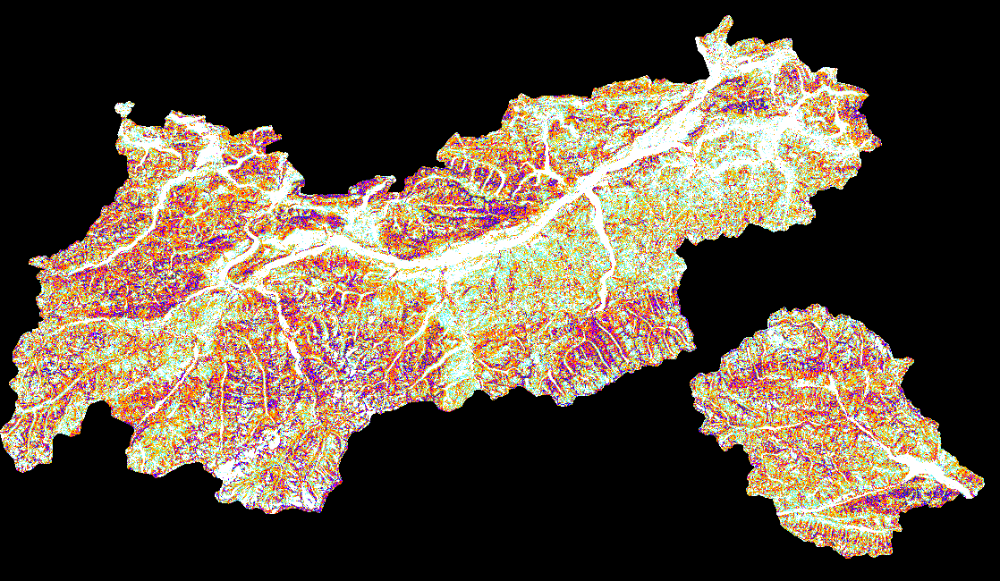

In [12]:
dest = S.eslo_tiny('slope_local/tyrol_slope.tif', res=200)
Image(dest)
# 1 minute

gdalwarp -overwrite -tr 200 -200 /home/me/code/eddy-geek/slope-ign-alti/slope_local/styrol_slope.tif tiny.tif
Creating output file that is 816P x 504L.
Processing /home/me/code/eddy-geek/slope-ign-alti/slope_local/styrol_slope.tif [1/1] : 0Using internal nodata values (e.g. -9999) for image /home/me/code/eddy-geek/slope-ign-alti/slope_local/styrol_slope.tif.
Copying nodata values from source /home/me/code/eddy-geek/slope-ign-alti/slope_local/styrol_slope.tif to destination tiny.tif.
...10...20...30...40...50...60...70...80...90...100 - done.
gdaldem color-relief tiny_slope.tif ~/code/eddy-geek/TIL/geo/data/gdaldem-slope-eslo13near.clr tiny_eslo13near.png -nearest_color_entry
0...10...20...30...40...50...60...70...80...90...100 - done.


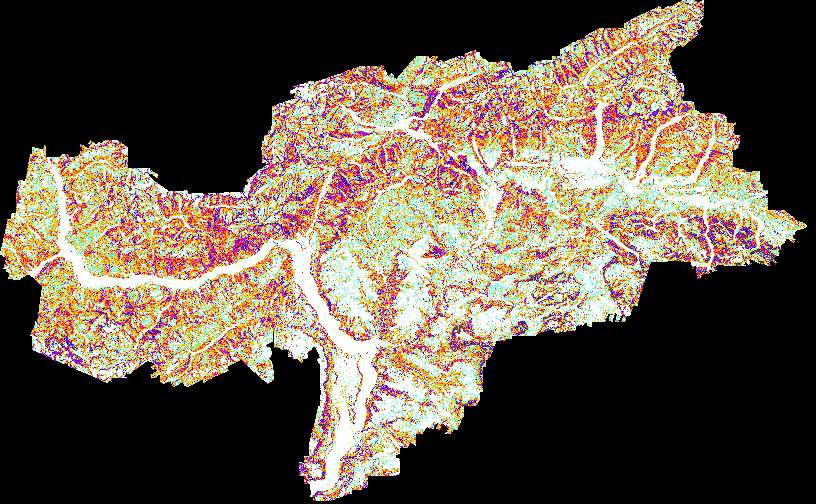

In [10]:
dest = S.eslo_tiny('slope_local/styrol_slope.tif', res=200)
Image(dest)
# 1 minute

### Merge slopes

In [15]:
# Put most precise last, for overlap
wsrc = (
        'slope_local/bavaria_slope.tif '    # 50m
        'slope_local/austria_slope.tif '    # 10m
        'slope_local/lombardia_slope.tif '  # 5m
        'slope_local/piemont_slope.tif '    # 5m, west
        'slope_local/tyrol_slope.tif '      # 5m
        'slope_local/styrol_slope.tif '     # 2.5m
        'slope_local/aoste_slope.tif '      # 2m, west
        'slope_local/chc_slope.tif '        # 2m
        'slope_local/trento_slope.tif '     # 1m
)

In [16]:
for z in (15, 16):
    S.warp_slopes(src=wsrc, dest=f'{SLOP_CX}_z{z}.tif', z=z, extent=bbox.bbcalps)
# z16: 16 minutes, 7GB
# z15: 12 minutes, 3GB


      gdalwarp -ot Byte \
        -co COMPRESS=ZSTD -co PREDICTOR=2 -co ZSTD_LEVEL=3 -co TILED=YES -co blockXsize=1024 -co blockYsize=1024 -co BIGTIFF=YES -co SPARSE_OK=TRUE -co NUM_THREADS=ALL_CPUS -multi -wo NUM_THREADS=ALL_CPUS -overwrite  \
        -t_srs EPSG:3857 -tr 19.10925707129406 -19.10925707129406 -r q3 \
        -te_srs WGS84 -te 7.734 45.583 11.953 47.517  -dstnodata 255  \
        slope_local/bavaria_slope.tif slope_local/austria_slope.tif slope_local/lombardia_slope.tif slope_local/piemont_slope.tif slope_local/tyrol_slope.tif slope_local/styrol_slope.tif slope_local/aoste_slope.tif slope_local/chc_slope.tif slope_local/trento_slope.tif  alpsc/AlpsC_slope_z13.tif
Creating output file that is 24577P x 16385L.
Processing slope_local/bavaria_slope.tif [1/9] : 0Using internal nodata values (e.g. -9999) for image slope_local/bavaria_slope.tif.
...10...Processing slope_local/austria_slope.tif [2/9] : Using internal nodata values (e.g. -9999) for image slope_local/austria_slop

In [23]:
for z in 14, 13, 12:
    S.make_ovr(src=f'{SLOP_CX}_z{z+2}.tif', dest=f'{SLOP_CX}_z{z}.tif', z=z, reuse=True)
# 1 GB / 200MB / 50 MB

      gdalwarp -r q3 -tr 38.21851414258813 -38.21851414258813 \
        -co COMPRESS=ZSTD -co PREDICTOR=2 -co ZSTD_LEVEL=3 -co TILED=YES -co blockXsize=1024 -co blockYsize=1024 -co BIGTIFF=YES -co SPARSE_OK=TRUE -co NUM_THREADS=ALL_CPUS -multi -wo NUM_THREADS=ALL_CPUS -overwrite   \
        alpsc/AlpsC_slope_z14.tif alpsc/AlpsC_slope_z12.tif
Creating output file that is 12289P x 8192L.
Processing alpsc/AlpsC_slope_z14.tif [1/1] : 0Using internal nodata values (e.g. 255) for image alpsc/AlpsC_slope_z14.tif.
Copying nodata values from source alpsc/AlpsC_slope_z14.tif to destination alpsc/AlpsC_slope_z12.tif.
...10...20...30...40...50...60...70...80...90...100 - done.


'alpsc/AlpsC_slope_z12.tif'

In [27]:
files=[]
for z, cname in {
        16: 'eslo13near',
        15: 'eslo13near',
        14: 'eslo4near',
        13: 'eslo4near',  # TBD oslo3near
        12: 'eslo2',
    }.items():
        chkpoint = time()
        to_merge = S.slope_mbt(cname, z=z, src=f'{SLOP_CX}_z{z}.tif', dest=f'alpsc/AlpsC_{cname}_z{z}.mbtiles', reuse=True)
        files.append(os.path.expanduser(to_merge))  # f'{cname}-z{z}.mbtiles')
        print(f'Zoom {z} completed in {round(time()-chkpoint,1)} seconds')
S.mbt_merge(*files, dest=f'alpsc/AlpsC_eslo.mbtiles')

# 80 minutes

\
      sed 's/nv \+0 \+0 \+0/nv  255 255 255/g' \
          ~/code/eddy-geek/TIL/geo/data/gdaldem-slope-eslo13near.clr >! /tmp/gdaldem-slope-eslo13near.clr && \
      gdaldem color-relief alpsc/AlpsC_slope_z16.tif /tmp/gdaldem-slope-eslo13near.clr alpsc/AlpsC_eslo13near_z16.mbtiles \
          -nearest_color_entry -co TILE_FORMAT=png8 
0...10...20...30...40...50...60...70...80...90...100 - done.
Zoom 16 completed in 3376.5 seconds
\
      sed 's/nv \+0 \+0 \+0/nv  255 255 255/g' \
          ~/code/eddy-geek/TIL/geo/data/gdaldem-slope-eslo13near.clr >! /tmp/gdaldem-slope-eslo13near.clr && \
      gdaldem color-relief alpsc/AlpsC_slope_z15.tif /tmp/gdaldem-slope-eslo13near.clr alpsc/AlpsC_eslo13near_z15.mbtiles \
          -nearest_color_entry -co TILE_FORMAT=png8 
0...10...20...30...40...50...60...70...80...90...100 - done.
Zoom 15 completed in 914.4 seconds
\
      sed 's/nv \+0 \+0 \+0/nv  255 255 255/g' \
          ~/code/eddy-geek/TIL/geo/data/gdaldem-slope-eslo4near.clr >! /tmp/gd

gdalwarp -overwrite -tr 76.43702828517624 -76.43702828517624 alpsc/AlpsC_slope_z13.tif /tmp/tiny.tif
Creating output file that is 6144P x 4096L.
Processing alpsc/AlpsC_slope_z13.tif [1/1] : 0Using internal nodata values (e.g. 255) for image alpsc/AlpsC_slope_z13.tif.
Copying nodata values from source alpsc/AlpsC_slope_z13.tif to destination /tmp/tiny.tif.
...10...20...30...40...50...60...70...80...90...100 - done.
gdaldem color-relief /tmp/tiny_slope.tif ~/code/eddy-geek/TIL/geo/data/gdaldem-slope-eslo13near.clr /tmp/tiny_eslo13near.png -nearest_color_entry
0...10...20...30...40...50...60...70...80...90...100 - done.


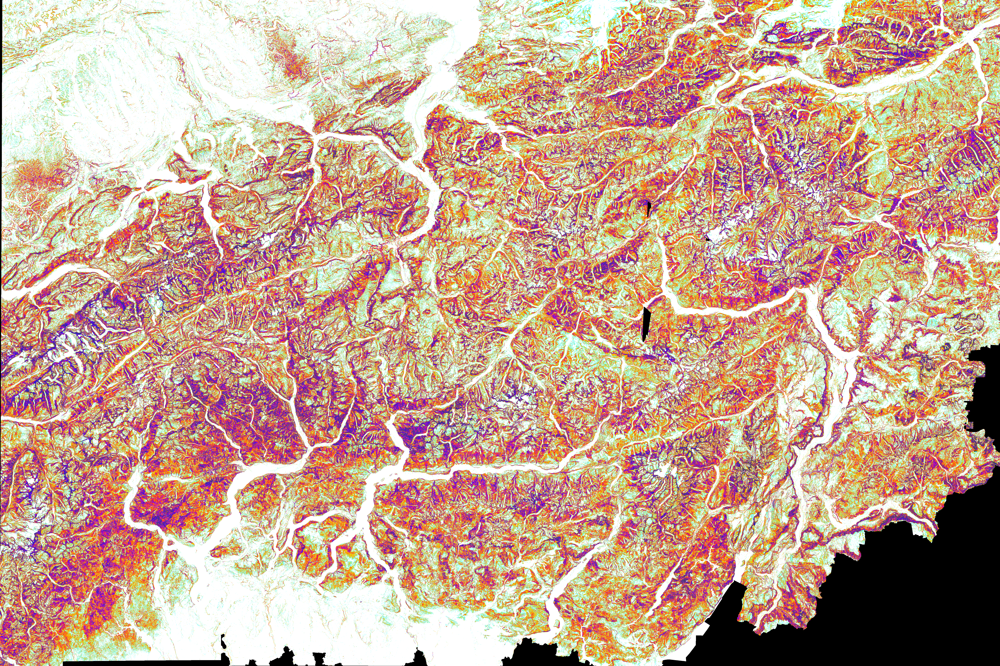

In [17]:
Image(S.eslo_tiny(SLOP_CX + '_z13.tif', res=S.resolutions[11]))

In [ ]:
S.warp_slopes(src=wsrc, dest=SLOP_CX + '_z16.vrt', z=16, extent=bbox.bbcalps)

### Add overviews

In [ ]:

S.slope_mbt_5_zooms('alps/AlpsC_slopes.tif', reuse=True)
M.mbt_merge('alps/white9.mbtiles', dest='alps/esloAlpsW.mbtiles')

In [9]:
M.mbt_merge(ESLO_CX+'.mbtiles', 'alps/esloAlpsW.mbtiles', dest='alpsc/AlpsWC_eslo.mbtiles')

cp alpsc/AlpsC_eslo.mbtiles alpsc/AlpsWC_eslo.mbtiles
<<>> alpsc/AlpsC_eslo : zoom = 12 16 ; n = 526261 ; format = png ; bounds = 7.73399999999999999,45.5829616352129463,11.9530933227539062,47.5169999999999959
<< alps/esloAlpsW : zoom = 9 16 ; n = 391698 ; format = png ; bounds = 5.62499878087688998,43.5797725532024245,7.73437500000000089,46.558000000000014
>> alpsc/AlpsWC_eslo : zoom = 9 16 ; n = 917475 ; format = png ; bounds = 5.62499878087688998,43.5797725532024245,11.9530933227539062,47.5169999999999959
alpsc/AlpsWC_eslo Merge of the following files:
* alpsc/AlpsC_eslo : Merge of the following files:
* AlpsC_eslo13near_z16 : AlpsC_eslo13near_z16
* AlpsC_eslo13near_z15 : AlpsC_eslo13near_z15
* AlpsC_eslo4near_z14 : AlpsC_eslo4near_z14
* AlpsC_eslo4near_z13 : AlpsC_eslo4near_z13
* AlpsC_eslo2_z12 : AlpsC_eslo2_z12

* alps/esloAlpsW : Merge of the following files:
* alps/esloAlpsW : Merge of the following files:
* alps/esloAlpsW : Merge of the following files:
* eslo13near-z16 : eslo

In [47]:
M.mbt_info('alpsc/AlpsWC_eslo.mbtiles')

'zoom = 9 16 ; n = 917475 ; bounds = 5.62500,43.57977,11.95309,47.51700 ; format = png'

In [40]:
M.update_mbt_meta('alpsc/AlpsWC_eslo.mbtiles', name='eSlope Alps Aix<->Brixlegg', desc='https://github.com/eslopemap/eslope', zmin=12, zmax=16, format='png')

In [46]:
# M.set_bounds('alpsc/AlpsWC_eslo.mbtiles',*M.get_bounds('alpsc/AlpsWC_eslo.mbtiles'))

In [51]:
# !~/code/UPSTREAM/pmtiles/python/bin/pmtiles-convert 'alpsc/AlpsWC_eslo.mbtiles' 'alpsc/AlpsWC_eslo.pmtiles'

Num tiles: 917475
Num unique tiles: 805968
Num leaves: 7


In [58]:
import sys
sys.path.insert(0, os.path.expanduser('~/code/UPSTREAM/pmtiles/python/'))
# pip install pmtiles

from pmtiles import convert

In [63]:
convert.mbtiles_to_pmtiles('alpsc/AlpsWC_eslo.mbtiles', 'alpsc/AlpsWC_eslo.pmtiles', None)

Num tiles: 917475
Num unique tiles: 805968
Num leaves: 10880


In [64]:
!aws s3 cp  --acl public-read  alpsc/AlpsWC_eslo.pmtiles  s3://maps/

upload: alpsc/AlpsWC_eslo.pmtiles to s3://maps/AlpsWC_eslo.pmtiles
